# **Check if the hierarchy is correct and generate edges**

*If you need to clear the workspace use globals().clear()*

In [22]:
#globals().clear()

In [1]:
#Import libraries
import torch
import geopandas as gpd
import pandas as pd
from pathlib import Path
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource
import rasterio
from rasterio.plot import show
import tsl

In [43]:
# Read the shapefiles
subc_all = gpd.read_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_catchments.shp') #all subatchments (one for each gauge)
subc = gpd.read_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_sub_catchments.shp') # subcatchments (i.e. headwater- and intercatchments)

# Extract the StationIDs
subc_ids = set(subc['gauge_id'])
all_ids = set(subc_all['gauge_id'])

# Identify missing catchments
missing_ids = all_ids - subc_ids
print(f"Missing catchments: {missing_ids}")

Missing catchments: {2022.0, 2154.0, 2027.0, 2026.0, 2032.0}


In [3]:
print(subc.columns)

Index(['gauge_id', 'ID6', 'gauge_name', 'water_body', 'type', 'country', 'H1',
       'H2', 'Shape_Leng', 'Shape_Area', 'ORIG_FID', 'geometry'],
      dtype='object')


In [4]:
print(subc_all.columns)

Index(['gauge_id', 'ID6', 'gauge_name', 'water_body', 'type', 'country',
       'Shape_Leng', 'Shape_Area', 'ORIG_FID', 'geometry'],
      dtype='object')


In [5]:
# Get unique values in the 'type' column
unique_types = subc['type'].unique()
print("Unique values in the 'type' column:", unique_types)

Unique values in the 'type' column: ['lake' 'stream']


In [6]:
# Identify gauge_ids corresponding to 'lake' type
lake_gauges = subc[subc['type'] == 'lake']['gauge_id'].tolist()
print("Gauge IDs corresponding to 'lake' type:", lake_gauges)

Gauge IDs corresponding to 'lake' type: [2004.0, 2007.0, 2014.0, 2017.0, 2021.0, 2023.0, 2025.0, 2028.0, 2031.0, 2043.0, 2066.0, 2072.0, 2073.0, 2074.0, 2081.0, 2082.0, 2088.0, 2093.0, 2097.0, 2101.0, 2118.0, 2137.0, 2168.0, 2207.0, 2208.0, 2209.0, 2484.0, 2642.0]


In [7]:
# Select the gauge_name corresponding to the missing gauge IDs
missing_gauge_names = subc_all[subc_all['gauge_id'].isin(missing_ids)][['gauge_name','water_body']]

# Print the result
print(missing_gauge_names)

    gauge_name          water_body
11     Locarno       Lago_Maggiore
15     Chillon           Lac_Léman
16     St-Prex           Lac_Léman
21  Romanshorn  Bodensee_(Obersee)
76    Grandson    Lac_de_Neuchâtel


With this code you select all edges

In [8]:
# extract the gauge ID together with the two hierarchical coding numbers H1 andH2
pfafstetter_codes = subc[['gauge_id','H1', 'H2']]

# Determine upstream vs downstream
def is_upstream(H1, H2, hi):
    return H1 <= hi < H2

edges = []
gauge_ids = pfafstetter_codes['gauge_id'].tolist()

print("Checking upstream relationships:")
for i, row_i in pfafstetter_codes.iterrows():
    for j, row_j in pfafstetter_codes.iterrows():
        if i != j and is_upstream(row_i['H1'], row_i['H2'], row_j['H1']):
                print(f"{row_j['gauge_id']} is upstream of {row_i['gauge_id']}")
                edges.append((gauge_ids.index(row_j['gauge_id']), gauge_ids.index(row_i['gauge_id'])))
        else:
            print(f"{row_j['gauge_id']} is NOT upstream of {row_i['gauge_id']}")

# build the Edge Index
edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()

# Example output
print("Edge index tensor:")
print(edge_index)

Checking upstream relationships:
2004.0 is NOT upstream of 2004.0
2007.0 is NOT upstream of 2004.0
2009.0 is NOT upstream of 2004.0
2011.0 is NOT upstream of 2004.0
2014.0 is NOT upstream of 2004.0
2016.0 is NOT upstream of 2004.0
2017.0 is NOT upstream of 2004.0
2018.0 is NOT upstream of 2004.0
2019.0 is NOT upstream of 2004.0
2020.0 is NOT upstream of 2004.0
2021.0 is NOT upstream of 2004.0
2023.0 is NOT upstream of 2004.0
2024.0 is NOT upstream of 2004.0
2025.0 is NOT upstream of 2004.0
2028.0 is NOT upstream of 2004.0
2029.0 is NOT upstream of 2004.0
2030.0 is NOT upstream of 2004.0
2031.0 is NOT upstream of 2004.0
2033.0 is NOT upstream of 2004.0
2034.0 is upstream of 2004.0
2041.0 is NOT upstream of 2004.0
2043.0 is NOT upstream of 2004.0
2044.0 is NOT upstream of 2004.0
2053.0 is NOT upstream of 2004.0
2056.0 is NOT upstream of 2004.0
2063.0 is NOT upstream of 2004.0
2066.0 is NOT upstream of 2004.0
2067.0 is NOT upstream of 2004.0
2068.0 is NOT upstream of 2004.0
2070.0 is NOT 

In [9]:
# Function to find upstream relationships using spatial containment
def find_upstream_relationships(subc, subc_all, missing_ids):
    edges = []
    for missing_id in missing_ids:
        missing_catchment = subc_all[subc_all['gauge_id'] == missing_id]
        for idx, subcatchment in subc.iterrows():
            if subcatchment.geometry.intersects(missing_catchment.geometry.iloc[0]):
                upstream_id = subcatchment['gauge_id']
                edges.append((upstream_id, missing_id))
    return edges

# Find upstream relationships for missing catchments
missing_edges = find_upstream_relationships(subc, subc_all, missing_ids)
print(f"Edges for missing catchments: {missing_edges}")

Edges for missing catchments: [(2011.0, 2022.0), (2020.0, 2022.0), (2021.0, 2022.0), (2033.0, 2022.0), (2068.0, 2022.0), (2074.0, 2022.0), (2086.0, 2022.0), (2087.0, 2022.0), (2101.0, 2022.0), (2167.0, 2022.0), (2206.0, 2022.0), (2244.0, 2022.0), (2321.0, 2022.0), (2342.0, 2022.0), (2346.0, 2022.0), (2347.0, 2022.0), (2349.0, 2022.0), (2351.0, 2022.0), (2356.0, 2022.0), (2364.0, 2022.0), (2368.0, 2022.0), (2387.0, 2022.0), (2419.0, 2022.0), (2420.0, 2022.0), (2430.0, 2022.0), (2461.0, 2022.0), (2463.0, 2022.0), (2474.0, 2022.0), (2475.0, 2022.0), (2494.0, 2022.0), (2498.0, 2022.0), (2605.0, 2022.0), (2607.0, 2022.0), (2612.0, 2022.0), (2629.0, 2022.0), (2631.0, 2022.0), (6001.0, 2022.0), (6002.0, 2022.0), (6003.0, 2022.0), (6004.0, 2022.0), (6005.0, 2022.0), (6006.0, 2022.0), (6007.0, 2022.0), (6008.0, 2022.0), (6009.0, 2022.0), (6010.0, 2022.0), (6011.0, 2022.0), (2004.0, 2154.0), (2007.0, 2154.0), (2028.0, 2154.0), (2034.0, 2154.0), (2085.0, 2154.0), (2119.0, 2154.0), (2160.0, 2154.0

In [10]:
# Existing edges from the subcatchments (previously determined)
# Assume edges_sub is already defined as in previous steps

# Combine edges
all_edges = edges + missing_edges

# Convert to PyTorch tensor
all_edge_index = torch.tensor(all_edges, dtype=torch.long).t().contiguous()
print("Updated edge index tensor:")
print(all_edge_index)

Updated edge index tensor:
tensor([[  19,  169,  145,  ..., 4024, 4025, 4026],
        [   0,    0,    1,  ..., 2032, 2032, 2032]])


With this code you select only edges of gauges immediately downstream

In [26]:
# Identify rows where 'type' is 'lake'
lake_rows = subc['type'] == 'lake'

# Remove rows where 'type' is 'lake'
subc_nolake = subc[~lake_rows]

# Assuming subc is a DataFrame containing the hierarchical codes and gauge IDs
pfafstetter_codes = subc_nolake[['gauge_id', 'H1', 'H2']]

# Create a dictionary for quick lookups of H1 and H2 values
h1_h2_dict = {row['gauge_id']: (row['H1'], row['H2']) for _, row in pfafstetter_codes.iterrows()}

# Function to find the immediate downstream gauge
def find_immediate_downstream(gauge_id, h1_h2_dict):
    h1, h2 = h1_h2_dict[gauge_id]
    #downstream_candidates = [(gid, h1_h2_dict[gid]) for gid in h1_h2_dict if h1_h2_dict[gid][0] <= h1 and h1_h2_dict[gid][1] > h2]
    downstream_candidates = [(gid, h1_h2_dict[gid]) for gid in h1_h2_dict if h1 > h1_h2_dict[gid][0] and h2 <= h1_h2_dict[gid][1]]
    if not downstream_candidates:
        return None
    # Sort candidates by H2 to find the immediate downstream gauge
    downstream_candidates.sort(key=lambda x: x[1][1])
    return downstream_candidates[0][0] if downstream_candidates else None

# Create edges list and downstream_dict
edges_downstr = []
downstream_dict = {}
gauge_ids_nolake = pfafstetter_codes['gauge_id'].tolist()
# Remove lakes' gauge_ids from the gauge_ids list
gauge_ids_nolake = [gauge_id for gauge_id in gauge_ids if gauge_id not in lake_gauges]

for gauge_id in gauge_ids_nolake:
    immediate_downstream = find_immediate_downstream(gauge_id, h1_h2_dict)
    if immediate_downstream is not None:
        downstream_dict[gauge_id] = immediate_downstream
        #edges_downstr.append((gauge_ids_nolake.index(immediate_downstream), gauge_ids_nolake.index(gauge_id)))
        edges_downstr.append((gauge_ids_nolake.index(gauge_id), gauge_ids_nolake.index(immediate_downstream)))

# Build the Edge Index
edge_downstr_index = torch.tensor(edges_downstr, dtype=torch.long).t().contiguous()

# Example output of Edge Index tensor
print("Edge index tensor:")
print(edge_downstr_index)

# Example of accessing the immediate downstream gauge for a specific gauge
target_gauge_id = 2019  # Ensure this is an integer if gauge_ids are integers

# Find the index of gauge_ids that matches the target_gauge_id
matching_index = next((index for index, gauge_id in enumerate(gauge_ids) if gauge_id == target_gauge_id), None)

if matching_index is not None:
    # Access the specific gauge_id using the matching index
    specific_gauge = gauge_ids[matching_index]

    # Get the next immediate downstream gauge from the dictionary
    next_downstream = downstream_dict.get(specific_gauge, None)
    if next_downstream is not None:
        print(f"The immediate downstream gauge for {specific_gauge} is {next_downstream}")
    else:
        print(f"There is no immediate downstream gauge for {specific_gauge}")
else:
    print(f"The gauge_id {target_gauge_id} was not found in the list.")

# Check the downstream mappings
for key, value in downstream_dict.items():
    print(f"{key} -> {value}")

# Check if the downstream relationship is correct for specific gauges
specific_gauges = [2219, 2151, 2488, 2030]
for gauge in specific_gauges:
    next_downstream = downstream_dict.get(gauge, None)
    print(f"The immediate downstream gauge for {gauge} is {next_downstream}")


Edge index tensor:
tensor([[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
          14,  15,  16,  17,  18,  20,  21,  22,  23,  24,  25,  26,  27,  28,
          29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,
          43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
          57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  70,  72,
          73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
          87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100,
         101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115,
         116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
         130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
         144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,
         158, 159, 160, 161, 162, 164, 165, 166, 167, 168, 169, 170, 171, 172,
         173, 174, 175, 176, 177,

In [38]:
# Check if the downstream relationship is correct for specific gauges
#specific_gauges = [2019, 2023, 2457, 2093]
#specific_gauges = [2019, 2457, 2200, 2109, 2159]
#specific_gauges = [2432, 2486, 2009, 5023, 5026, 5029,5023,5018]
specific_gauges = [6006,6001,6002,6005,6010,6008,6009,2368,2068,2167]
for gauge in specific_gauges:
    next_downstream = downstream_dict.get(gauge, None)
    print(f"The immediate downstream gauge for {gauge} is {next_downstream}")

The immediate downstream gauge for 6006 is 6005.0
The immediate downstream gauge for 6001 is 6002.0
The immediate downstream gauge for 6002 is 6007.0
The immediate downstream gauge for 6005 is 6007.0
The immediate downstream gauge for 6010 is 6011.0
The immediate downstream gauge for 6008 is 6011.0
The immediate downstream gauge for 6009 is 6011.0
The immediate downstream gauge for 2368 is 6011.0
The immediate downstream gauge for 2068 is 6011.0
The immediate downstream gauge for 2167 is 6011.0


# Make plots

In [13]:
#Check the projection
print(subc.crs, subc.crs.is_projected)

EPSG:2056 True


In [14]:
subc.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [15]:
# Define further file paths
relief_fp = r'S:/CAMELS-CH/CAMELS-CH/CAMELS-CH_exchange/relief_1_1mio.tif'
lakes_fp = r'S:/CAMELS-CH/CAMELS-CH/CAMELS-CH_exchange/dkm1m_gewaesser_ply.gpkg'
rivers_fp = r'S:/CAMELS-CH/CAMELS-CH/CAMELS-CH_exchange/dkm1m_gewaesser_lin.gpkg'
boundaries_fp = r'S:/CAMELS-CH/CAMELS-CH/CAMELS-CH_exchange/dkm1m_grenzband.gpkg'
gauging_stations_fp = r'S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_gauging_stations.shp'

# Load shapefiles
lakes = gpd.read_file(lakes_fp, layer='dkm1m_gewaesser_ply')
rivers = gpd.read_file(rivers_fp, layer='dkm1m_gewaesser_lin')
boundaries = gpd.read_file(boundaries_fp, layer='dkm1m_grenzband')
gauging_stations = gpd.read_file(gauging_stations_fp)

Plot first the all the data to get an overview

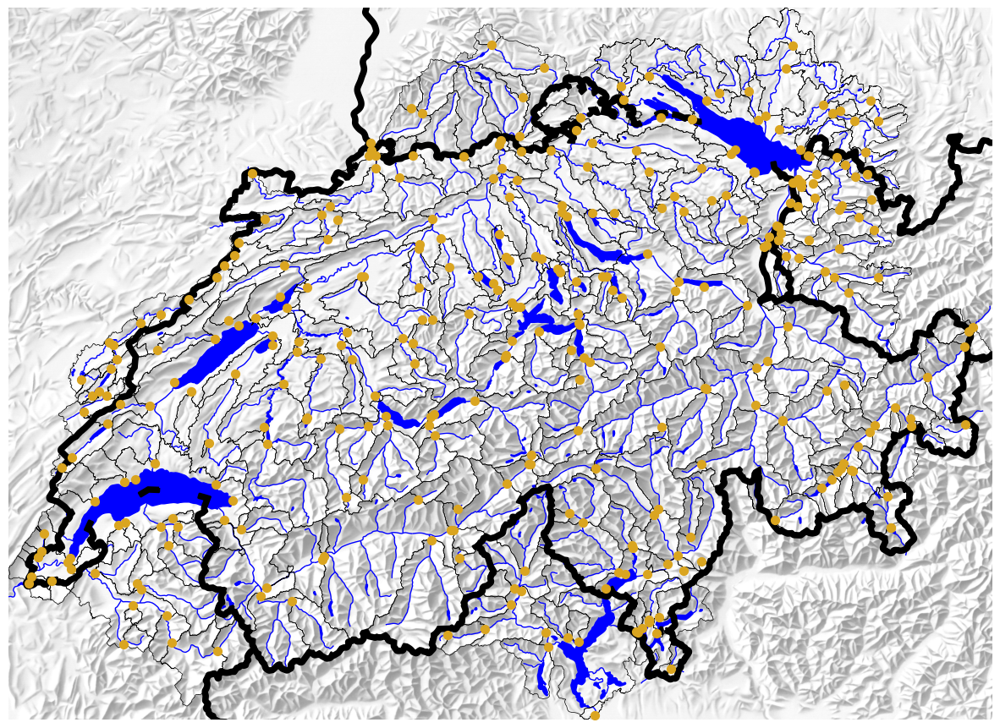

In [16]:
# Plotting
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the relief
with rasterio.open(relief_fp) as src:
    show(src, ax=ax, cmap='gray', zorder=0)

# Plot rivers
rivers.plot(ax=ax, color='blue', linewidth=1, zorder=1)

# Plot lakes
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, zorder=2)

# Plot boundaries
boundaries.plot(ax=ax, edgecolor='black', linewidth=2, facecolor='black', zorder=3)

# Plot subcatchments
subc.plot(ax=ax, edgecolor='black', linewidth=0.5, facecolor='none', zorder=4)

# Plot gauging stations
gauging_stations.plot(ax=ax, color='goldenrod', markersize=50, marker='o', zorder=5)

# Set plot title and remove axes
ax.set_axis_off()
ax.set_frame_on(False)

# Get the bounds of the subcatchments to set plot limits
bounds = subc.total_bounds  # returns (minx, miny, maxx, maxy)
# Crop the plot to the extent of the subcatchments
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

# Show plot
plt.show()


Now make a network from the edges and plot it

In [17]:
import networkx as nx

In [18]:
#Reset gauge_ids
#gauge_ids = subc[['gauge_id']]
#gauge_ids = gauge_ids['gauge_id'].tolist()

In [19]:
# Create a graph and add nodes and edges
G = nx.DiGraph()
for gauge_id in gauge_ids:
    G.add_node(gauge_id)

for edge in edges:
    G.add_edge(gauge_ids[edge[0]], gauge_ids[edge[1]])

# Get the coordinates of the gauging stations
coords = gauging_stations.set_index('gauge_id').geometry.apply(lambda x: (x.x, x.y)).to_dict()


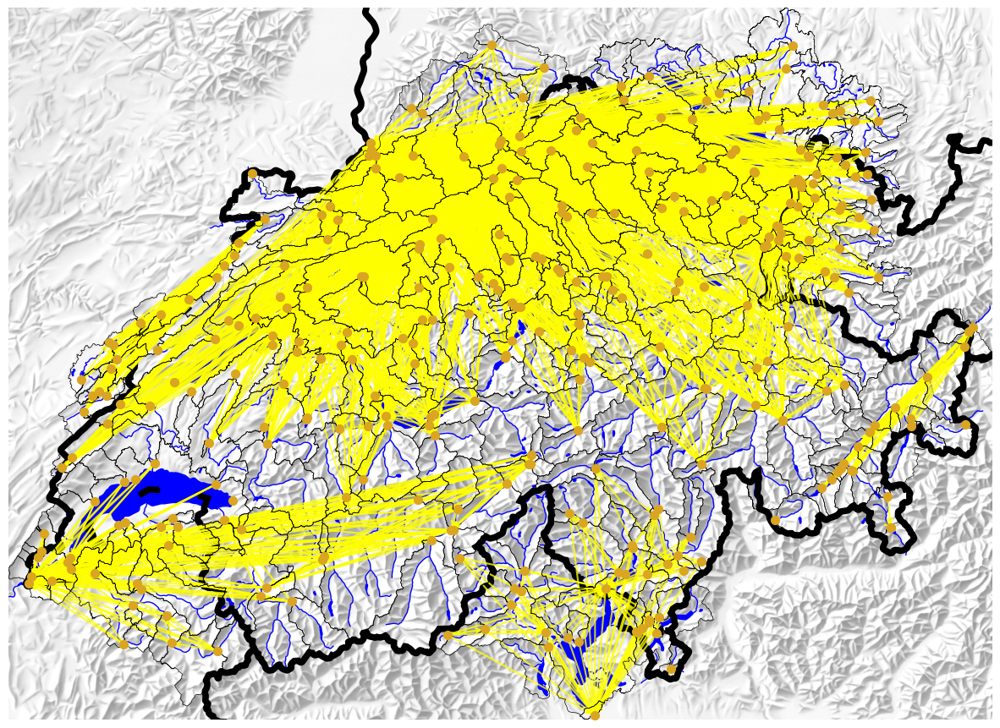

In [20]:
import matplotlib.patheffects as pe

# Plotting
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the relief
with rasterio.open(relief_fp) as src:
    show(src, ax=ax, cmap='gray', zorder=0)

# Plot rivers
rivers.plot(ax=ax, color='blue', linewidth=1, zorder=1)

# Plot lakes
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, zorder=2)

# Plot boundaries
boundaries.plot(ax=ax, edgecolor='black', linewidth=2, facecolor='black', zorder=3)

# Plot subcatchments
subc.plot(ax=ax, edgecolor='black', linewidth=0.5, facecolor='none', zorder=4)

# Plot gauging stations
gauging_stations.plot(ax=ax, color='goldenrod', markersize=50, marker='o', zorder=5)

# Plot edges (upstream-downstream connections)
for (src, dst) in G.edges:
    src_x, src_y = coords[src]
    dst_x, dst_y = coords[dst]

    # Bottom arrow (darker border)
    #ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
    #            arrowprops=dict(arrowstyle='->', color='black', lw=2.5, alpha=0.8),
    #            zorder=6)
    
    # Top arrow (original color)
    ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
                arrowprops=dict(arrowstyle='->', color='yellow', lw=1.5, alpha=0.8))
    
    # Add path effects for darker border
    #arrow.arrow_patch.set_path_effects([
    #    pe.Stroke(linewidth=2, foreground='black'),
    #    pe.Normal()
    #])

# Set plot title and remove axes
ax.set_axis_off()
ax.set_frame_on(False)

# Get the bounds of the subcatchments to set plot limits
bounds = subc.total_bounds  # returns (minx, miny, maxx, maxy)
# Crop the plot to the extent of the subcatchments
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

# Show plot
plt.show()


Now do the same but only looking at gauges immediately downstream of a gauging station

In [23]:
#First only select also the gauging stations that are measuring discharge (i.e. discharge lake level stations)
gauging_stations_nolake = gauging_stations[gauging_stations['gauge_id'].isin(gauge_ids_nolake)]

In [28]:
# Create a graph and add nodes and edges
G_downstr = nx.DiGraph()
for gauge_id in gauge_ids_nolake:
    G_downstr.add_node(gauge_id)

for edge_downstr in edges_downstr:
    G_downstr.add_edge(gauge_ids_nolake[edge_downstr[0]], gauge_ids_nolake[edge_downstr[1]])

# Get the coordinates of the gauging stations
coords_downstr = gauging_stations.set_index('gauge_id').geometry.apply(lambda x: (x.x, x.y)).to_dict()

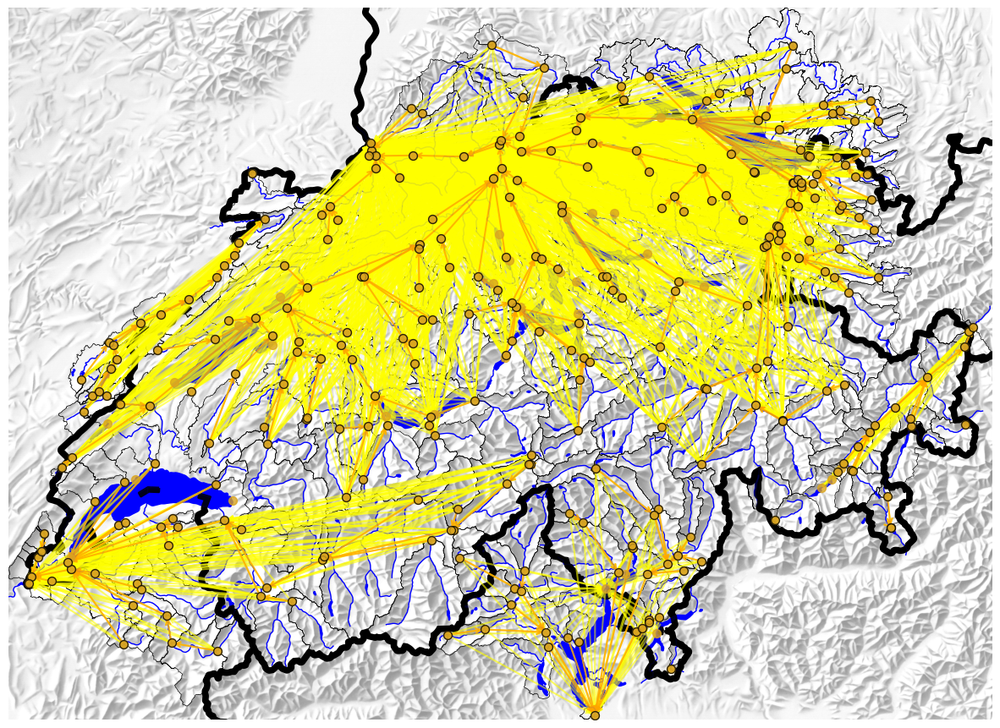

In [37]:
# Plotting
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the relief
with rasterio.open(relief_fp) as src:
    show(src, ax=ax, cmap='gray', zorder=0)

# Plot rivers
rivers.plot(ax=ax, color='blue', linewidth=1, zorder=1)

# Plot lakes
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, zorder=2)

# Plot boundaries
boundaries.plot(ax=ax, edgecolor='black', linewidth=2, facecolor='black', zorder=3)

# Plot subcatchments
subc_nolake.plot(ax=ax, edgecolor='black', linewidth=0.5, facecolor='none', zorder=4)

# Plot edges (upstream-downstream connections)
for (src, dst) in G.edges:
    src_x, src_y = coords[src]
    dst_x, dst_y = coords[dst]
    ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
                arrowprops=dict(arrowstyle='->', color='yellow', lw=1.5, alpha=0.6), zorder=5)

# Plot edges (upstream-downstream connections)
for (src, dst) in G_downstr.edges:
    src_x, src_y = coords[src]
    dst_x, dst_y = coords[dst]
    ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
                arrowprops=dict(arrowstyle='->', color='orange', lw=1.5, alpha=0.8), zorder=6)

rivers.plot(ax=ax, color='blue', linewidth=1, alpha=0.1, zorder=7)
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, alpha=0.1, zorder=8)

# Plot gauging stations
gauging_stations.plot(ax=ax, color='goldenrod', markersize=50, marker='o', alpha = 0.7, zorder=9)
gauging_stations_nolake.plot(ax=ax, color='goldenrod', markersize=50, marker='o', edgecolors='black', alpha = 0.8, zorder=10)

# Set plot title and remove axes
ax.set_axis_off()
ax.set_frame_on(False)

# Get the bounds of the subcatchments to set plot limits
bounds = subc_nolake.total_bounds  # returns (minx, miny, maxx, maxy)
# Crop the plot to the extent of the subcatchments
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

# Show plot
plt.show()

# Now prepare what you will need to add to the (graph) modelling part 

That is: all edges but without the lakes' gauging stations, and for each gauge the ID of the first downstream point

To do this we need to:
1) make sure that subcatchments assigned to lakes get merged with the subcatchments corresponding to the next downstream gauging station
2) that the new polygon inherits all the attributes from the next downstream gauging station besides H1 and H2(*? => see Note*). The Shape_Area and Shape_Leng need both to get updated!

*Note: H1 and H2 can be inherited only if there is another downstream point, that is however an expection: it is only true in the case of the Lago Maggiore (gauge_id=6011).*

*For all other lakes is is important to adopt the downstram H1 and H2 in order to avoid gaps*

In [39]:
# Create a dictionary for quick lookups of H1 and H2 values
h1_h2_dict_withlakes = {row['gauge_id']: (row['H1'], row['H2']) for _, row in subc.iterrows()}

# Find the immediate downstream gauge for each lake gauge
downstream_gauges_lakes = {gauge: find_immediate_downstream(gauge, h1_h2_dict_withlakes) for gauge in lake_gauges}

print("Downstream gauges for lake gauges:")
for lake_gauge, downstream_gauge_lake in downstream_gauges_lakes.items():
    print(f"Lake gauge {lake_gauge} -> Downstream gauge {downstream_gauge_lake}")

Downstream gauges for lake gauges:
Lake gauge 2004.0 -> Downstream gauge 2447.0
Lake gauge 2007.0 -> Downstream gauge 2378.0
Lake gauge 2014.0 -> Downstream gauge 2099.0
Lake gauge 2017.0 -> Downstream gauge 2125.0
Lake gauge 2021.0 -> Downstream gauge 2167.0
Lake gauge 2023.0 -> Downstream gauge 2457.0
Lake gauge 2025.0 -> Downstream gauge 2207.0
Lake gauge 2028.0 -> Downstream gauge 2606.0
Lake gauge 2031.0 -> Downstream gauge 2477.0
Lake gauge 2043.0 -> Downstream gauge 2288.0
Lake gauge 2066.0 -> Downstream gauge 2644.0
Lake gauge 2072.0 -> Downstream gauge 2073.0
Lake gauge 2073.0 -> Downstream gauge 2105.0
Lake gauge 2074.0 -> Downstream gauge 6011.0
Lake gauge 2081.0 -> Downstream gauge 2082.0
Lake gauge 2082.0 -> Downstream gauge 2415.0
Lake gauge 2088.0 -> Downstream gauge 2102.0
Lake gauge 2093.0 -> Downstream gauge 2030.0
Lake gauge 2097.0 -> Downstream gauge 2016.0
Lake gauge 2101.0 -> Downstream gauge 2021.0
Lake gauge 2118.0 -> Downstream gauge 2104.0
Lake gauge 2137.0 ->

In [111]:
subc_mod=subc

The shapefile appears to have topological errors ( E.g. for gauge_id 2288: *TopologyException: Input geom 0 is invalid: Ring Self-intersection at or near point 2704428.3354000002 1289654.242899999 0 at 2704428.3354000002 1289654.242899999 0*)

After editing manually the subcatcment 2288 in ArcGIS (there were vertices all around the place..we removed these), it's still not working..let us try to repair the geomotry directly here!

In [47]:
from shapely.geometry import shape
from shapely.errors import TopologicalError

# Define function to clean geometries
def clean_geometry(geom):
    try:
        return geom.buffer(0)
    except TopologicalError:
        print(f"Failed to clean geometry: {geom}")
        return None

In [112]:
# Merge lake subcatchments with their downstream subcatchments
for lake_gauge, downstream_gauge_lake in downstream_gauges_lakes.items():
    if downstream_gauge_lake is not None:
        print(downstream_gauge_lake)
        # Get the geometries of the lake and downstream subcatchments
        lake_geom = subc_mod.loc[subc_mod['gauge_id'] == lake_gauge, 'geometry'].values[0]
        downstream_geom = subc_mod.loc[subc_mod['gauge_id'] == downstream_gauge_lake, 'geometry'].values[0]

        # Clean geometries before merging
        lake_geom = clean_geometry(lake_geom)
        downstream_geom = clean_geometry(downstream_geom)

        if lake_geom is not None and downstream_geom is not None:
            # Merge geometries
            merged_geom = lake_geom.union(downstream_geom)

            # Update the geometry of the downstream subcatchment
            subc_mod.loc[subc_mod['gauge_id'] == downstream_gauge_lake, 'geometry'] = merged_geom
            # Calculate and update Shape_Len and Shape_Area
            subc_mod.loc[subc_mod['gauge_id'] == downstream_gauge_lake, 'Shape_Leng'] = merged_geom.length
            subc_mod.loc[subc_mod['gauge_id'] == downstream_gauge_lake, 'Shape_Area'] = merged_geom.area

# Remove lake subcatchments
subc_mod = subc_mod[~lake_rows]

2447.0
2378.0
2099.0
2125.0
2167.0
2457.0
2207.0
2606.0
2477.0
2288.0
2644.0
2073.0
2105.0
6011.0
2082.0
2415.0
2102.0
2030.0
2016.0
2021.0
2104.0
2416.0
2417.0
2152.0
2029.0
2099.0
2084.0
2446.0


We need to update H1 and H2 for the Lago Maggiore (as there are no other subcatchments further downstream)

In [113]:

subc_mod[subc_mod['gauge_id'] == 6011][['gauge_id', 'H1', 'H2']]

,gauge_id,H1,H2
325,6011.0,454,520


In [114]:
subc_mod.loc[subc_mod['gauge_id'] == 6011, 'H1'] = 455
subc_mod.loc[subc_mod['gauge_id'] == 6011, 'H2'] = 519

Repeat the edges definition&co (in the dame fashion as already done above for all gauging points)

In [64]:
# extract the gauge ID together with the two hierarchical coding numbers H1 andH2
pfafstetter_codes_mod = subc_mod[['gauge_id','H1', 'H2']]

edges_mod = []
gauge_ids_mod = pfafstetter_codes_mod['gauge_id'].tolist()

print("Checking upstream relationships:")
for i, row_i in pfafstetter_codes_mod.iterrows():
    for j, row_j in pfafstetter_codes_mod.iterrows():
        if i != j and is_upstream(row_i['H1'], row_i['H2'], row_j['H1']):
                print(f"{row_j['gauge_id']} is upstream of {row_i['gauge_id']}")
                edges_mod.append((gauge_ids_mod.index(row_j['gauge_id']), gauge_ids_mod.index(row_i['gauge_id'])))
        else:
            print(f"{row_j['gauge_id']} is NOT upstream of {row_i['gauge_id']}")

# build the Edge Index
edge_index_mod = torch.tensor(edges_mod, dtype=torch.long).t().contiguous()

# Example output
print("Edge index tensor:")
print(edge_index_mod)

Checking upstream relationships:
2009.0 is NOT upstream of 2009.0
2011.0 is upstream of 2009.0
2016.0 is NOT upstream of 2009.0
2018.0 is NOT upstream of 2009.0
2019.0 is NOT upstream of 2009.0
2020.0 is NOT upstream of 2009.0
2024.0 is upstream of 2009.0
2029.0 is NOT upstream of 2009.0
2030.0 is NOT upstream of 2009.0
2033.0 is NOT upstream of 2009.0
2034.0 is NOT upstream of 2009.0
2041.0 is NOT upstream of 2009.0
2044.0 is NOT upstream of 2009.0
2053.0 is upstream of 2009.0
2056.0 is NOT upstream of 2009.0
2063.0 is NOT upstream of 2009.0
2067.0 is NOT upstream of 2009.0
2068.0 is NOT upstream of 2009.0
2070.0 is NOT upstream of 2009.0
2078.0 is NOT upstream of 2009.0
2079.0 is NOT upstream of 2009.0
2084.0 is NOT upstream of 2009.0
2085.0 is NOT upstream of 2009.0
2086.0 is NOT upstream of 2009.0
2087.0 is NOT upstream of 2009.0
2091.0 is NOT upstream of 2009.0
2099.0 is NOT upstream of 2009.0
2102.0 is NOT upstream of 2009.0
2104.0 is NOT upstream of 2009.0
2105.0 is NOT upstream

Generate network

In [69]:
# Create a graph and add nodes and edges
G_mod = nx.DiGraph()
for gauge_id in gauge_ids_mod:
    G_mod.add_node(gauge_id)

for edge in edges_mod:
    G_mod.add_edge(gauge_ids_mod[edge[0]], gauge_ids_mod[edge[1]])

# Get the coordinates of the gauging stations
coords_mod = gauging_stations_nolake.set_index('gauge_id').geometry.apply(lambda x: (x.x, x.y)).to_dict()

Plot:

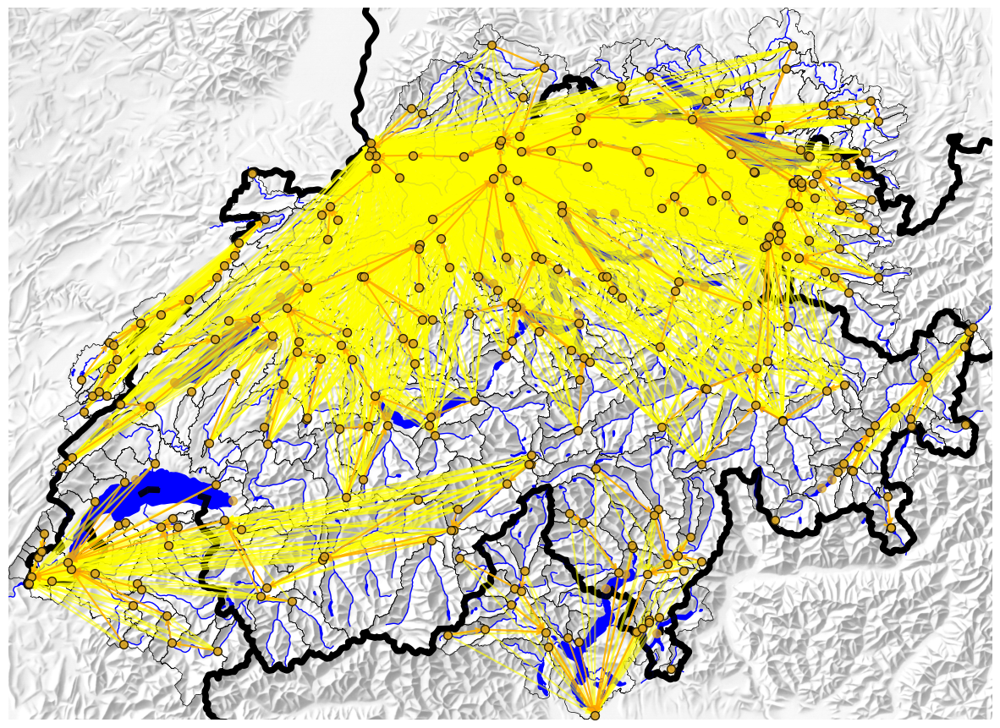

In [70]:
# Plotting
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the relief
with rasterio.open(relief_fp) as src:
    show(src, ax=ax, cmap='gray', zorder=0)

# Plot rivers
rivers.plot(ax=ax, color='blue', linewidth=1, zorder=1)

# Plot lakes
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, zorder=2)

# Plot boundaries
boundaries.plot(ax=ax, edgecolor='black', linewidth=2, facecolor='black', zorder=3)

# Plot subcatchments
subc_mod.plot(ax=ax, edgecolor='black', linewidth=0.5, facecolor='none', zorder=4)

# Plot edges (upstream-downstream connections)
for (src, dst) in G_mod.edges:
    src_x, src_y = coords_mod[src]
    dst_x, dst_y = coords_mod[dst]
    ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
                arrowprops=dict(arrowstyle='->', color='yellow', lw=1.5, alpha=0.6), zorder=5)

# Plot edges (upstream-downstream connections)
for (src, dst) in G_downstr.edges:
    src_x, src_y = coords[src]
    dst_x, dst_y = coords[dst]
    ax.annotate('', xy=(dst_x, dst_y), xytext=(src_x, src_y),
                arrowprops=dict(arrowstyle='->', color='orange', lw=1.5, alpha=0.8), zorder=6)

rivers.plot(ax=ax, color='blue', linewidth=1, alpha=0.1, zorder=7)
lakes.plot(ax=ax, color='blue', edgecolor='blue', linewidth=1, alpha=0.1, zorder=8)

# Plot gauging stations
gauging_stations.plot(ax=ax, color='goldenrod', markersize=50, marker='o', alpha = 0.7, zorder=9)
gauging_stations_nolake.plot(ax=ax, color='goldenrod', markersize=50, marker='o', edgecolors='black', alpha = 0.8, zorder=10)

# Set plot title and remove axes
ax.set_axis_off()
ax.set_frame_on(False)

# Get the bounds of the subcatchments to set plot limits
bounds = subc_mod.total_bounds  # returns (minx, miny, maxx, maxy)
# Crop the plot to the extent of the subcatchments
ax.set_xlim(bounds[0], bounds[2])
ax.set_ylim(bounds[1], bounds[3])

# Show plot
plt.show()

Now write down the gauging stations' file without the lakes gauging points, and by adding a column with the information on which is the next gauge (ID) downstream.

In [85]:
import numpy as np
# First add 'nextdownid' column
gauging_stations_mod = gauging_stations_nolake.copy()
gauging_stations_mod['nextdownid'] = np.nan  # Initialize with NaN (equivalent to NULL in GeoDataFrame)

In [86]:
# Iterate through the GeoDataFrame and set the next downstream gauge ID
for index, row in gauging_stations_mod.iterrows():
    gauge_id = row['gauge_id']
    nextdownid = downstream_dict.get(gauge_id, None)  # Get the next downstream gauge ID or None if not present
    gauging_stations_mod.at[index, 'nextdownid'] = nextdownid

# Verify the update
print(gauging_stations_mod[['gauge_id', 'nextdownid']].head())

   gauge_id  nextdownid
2    2009.0      2606.0
3    2011.0      2024.0
5    2016.0      2205.0
7    2018.0      2205.0
8    2019.0      2457.0


In [95]:
# Save the updated gauging stations shapefile
gauging_stations_mod.to_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_gauging_stations_mod.shp')

Add the nextdownid to the subcatchments file too, then we should be done with this pre-processing part!

In [115]:
# First add 'nextdownid' column
subc_mod2 = subc_mod.copy()
subc_mod2['nextdownid'] = np.nan  # Initialize with NaN (equivalent to NULL in GeoDataFrame)

In [116]:
# Iterate through the GeoDataFrame and set the next downstream gauge ID
for index, row in subc_mod2.iterrows():
    gauge_id = row['gauge_id']
    nextdownid = downstream_dict.get(gauge_id, None)  # Get the next downstream gauge ID or None if not present
    subc_mod2.at[index, 'nextdownid'] = nextdownid

# Verify the update
print(subc_mod2[['gauge_id', 'nextdownid']].head())

   gauge_id  nextdownid
2    2009.0      2606.0
3    2011.0      2024.0
5    2016.0      2205.0
7    2018.0      2205.0
8    2019.0      2457.0


In [117]:
subc.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [102]:
# Save the modified subcatchments shapefile
subc_mod2 = subc_mod2.set_crs(epsg=2056)
subc_mod2.to_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_sub_catchments_mod.shp',crs=subc.crs)

In [105]:
# Identify rows where 'type' is 'lake'
lake_rows2 = subc_all['type'] == 'lake'
# Remove rows where 'type' is 'lake'
subc_all_mod= subc_all[~lake_rows2]
# First add 'nextdownid' column
subc_all_mod2 = subc_all_mod.copy()
subc_all_mod2['nextdownid'] = np.nan  # Initialize with NaN (equivalent to NULL in GeoDataFrame)
# Iterate through the GeoDataFrame and set the next downstream gauge ID
for index, row in subc_all_mod2.iterrows():
    gauge_id = row['gauge_id']
    nextdownid = downstream_dict.get(gauge_id, None)  # Get the next downstream gauge ID or None if not present
    subc_all_mod2.at[index, 'nextdownid'] = nextdownid

# Verify the update
print(subc_all_mod2[['gauge_id', 'nextdownid']].head())

   gauge_id  nextdownid
2    2009.0      2606.0
3    2011.0      2024.0
5    2016.0      2205.0
7    2018.0      2205.0
8    2019.0      2457.0


In [109]:
subc_all.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [110]:
# Save the modified subcatchments shapefile
subc_all_mod2 = subc_all_mod2.set_crs(epsg=2056)
subc_all_mod2.to_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_catchments_mod.shp',crs=subc_all.crs)

In [118]:
subc_all_mod3 = gpd.read_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_catchments_mod.shp') #all subatchments (one for each gauge)

In [119]:
subc_all_mod3.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [120]:
del(subc_all_mod3)

We wanted to use the code by Klingler et al. 2021 (https://doi.org/10.5194/essd-13-4529-2021) Gauge_hierarchy.py to build the hierarchy by running the adapted script in Qgis.
It doesn't seem to work as somehow the EPSG doesn't get written out in a way that is compatible with QGIS requirements/formats (we guess?).
So here a trial to modify the script to be able to run it as standalone in python:

In [124]:
import collections

# Load shapefiles using GeoPandas
subbasins = gpd.read_file("S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_catchments_mod.shp")
gauges = gpd.read_file("S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_gauging_stations_mod.shp")

In [125]:
# Set CRS to EPSG:2056 if not already set
if subbasins.crs.to_epsg() != 2056:
    subbasins = subbasins.to_crs(epsg=2056)

if gauges.crs.to_epsg() != 2056:
    gauges = gauges.to_crs(epsg=2056)

# Output path
output = "S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/Gauge_hierarchy.csv"

# Create gauge ID list
ID_list = sorted(gauges["gauge_id"].tolist())

# Create dictionaries for storing the results, fill with number -999
UPID = dict.fromkeys(ID_list, -999)
DNID = dict.fromkeys(ID_list, -999)
ORD = dict.fromkeys(ID_list, -999)

# Create list from attributes of layer subbasins
HYDROID_list = subbasins["gauge_id"].tolist()
NDID_list = subbasins["nextdownid"].tolist()

# Check for duplicates and print them if there are any
if len(HYDROID_list) != len(set(HYDROID_list)):
    print("Duplicates in list")
    dupls = [item for item, count in collections.Counter(HYDROID_list).items() if count > 1]
    print(dupls)

# Function to find intersecting subbasins
def find_intersecting_subbasins(gauge_id):
    gauge_geom = gauges[gauges["gauge_id"] == gauge_id].geometry.iloc[0]
    intersecting_subbasins = subbasins[subbasins.intersects(gauge_geom)]
    return intersecting_subbasins

Apparently there are invalid geometries (this is the output if trying to do the intersection "manually"-i.e. via toolbox- in QGIS for gauge_id=2009:  for Feature (6) has invalid geometry. Please fix the geometry or change the Processing setting to the "Ignore invalid input features" option.
Execution failed after 0.14 seconds)

We need to fix the geometries first:

In [129]:
# Function to check and fix invalid geometries
def fix_invalid_geometries(gdf):
    gdf["valid_geometry"] = gdf.is_valid
    if not gdf["valid_geometry"].all():
        print(f"Fixing invalid geometries in GeoDataFrame with {len(gdf)} features.")
        gdf["geometry"] = gdf["geometry"].apply(lambda geom: geom.buffer(0) if not geom.is_valid else geom)
        gdf["valid_geometry"] = gdf.is_valid
        if not gdf["valid_geometry"].all():
            print(f"Warning: There are still invalid geometries after fixing attempt.")
        else:
            print(f"All geometries are valid after fixing.")
    else:
        print(f"All geometries are valid.")

# Fix invalid geometries in subbasins and gauges
fix_invalid_geometries(subbasins)
fix_invalid_geometries(gauges)

# Remove the auxiliary column
subbasins.drop(columns=["valid_geometry"], inplace=True)
gauges.drop(columns=["valid_geometry"], inplace=True)

Fixing invalid geometries in GeoDataFrame with 298 features.
All geometries are valid after fixing.
All geometries are valid.


In [130]:
# Output path
output = "S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/Gauge_hierarchy.csv"

# Create gauge ID list
ID_list = sorted(gauges["gauge_id"].tolist())

# Create dictionaries for storing the results, fill with number -999
UPID = dict.fromkeys(ID_list, -999)
DNID = dict.fromkeys(ID_list, -999)
ORD = dict.fromkeys(ID_list, -999)

# Create list from attributes of layer subbasins
HYDROID_list = subbasins["gauge_id"].tolist()
NDID_list = subbasins["nextdownid"].tolist()

# Check for duplicates and print them if there are any
if len(HYDROID_list) != len(set(HYDROID_list)):
    print("Duplicates in list")
    dupls = [item for item, count in collections.Counter(HYDROID_list).items() if count > 1]
    print(dupls)

# Function to find intersecting subbasins
def find_intersecting_subbasins(gauge_id):
    gauge_geom = gauges[gauges["gauge_id"] == gauge_id].geometry.iloc[0]
    intersecting_subbasins = subbasins[subbasins.intersects(gauge_geom)]
    return intersecting_subbasins

In [131]:
################################################
### A) CREATE TABLE WITH NEXT UPSTREAM GAUGE IDs

# Loop through all gauges
for x in ID_list:
    # print actual step
    print("step:", x)

    # create empty list for storing the gauge IDs
    GID = []

    # find intersecting subbasins
    intersecting_subbasins = find_intersecting_subbasins(x)

    if not intersecting_subbasins.empty:
        # get HYDROID of intersecting subbasin
        HYDROID = intersecting_subbasins["gauge_id"].tolist()

        # check if list contains HYDROID and when true: return index of ids
        upstrm_list = [i for i, value in enumerate(NDID_list) if value in HYDROID]

        # number of upstream subbasins
        upnum = len(upstrm_list)

        ## Write sign "-" to dictionary, if there are no upstream subbasins (indicates headwater basin)
        if upnum == 0:
            UPID[x] = ["-"]

        ## Loop to get further upstream subbasins
        while upnum > 0:
            # check if list contains HYDROID and if true: return index of feature
            upstrm_list = [i for i, value in enumerate(NDID_list) if value in HYDROID]

            # create empty list
            newhydro_list = []

            # loop for creating a list with the new HYDROIDs
            for i in upstrm_list:
                newhydro_list.append(subbasins.iloc[i]['gauge_id'])

            # overwrite HYDROID
            HYDROID = newhydro_list

            # refresh selection
            intersecting_subbasins = subbasins.iloc[upstrm_list]

            if not intersecting_subbasins.empty:
                # find intersecting gauges
                intersecting_gauges = gauges[gauges.intersects(intersecting_subbasins.unary_union)]
                
                # check if the selected subbasin intersects with a gauge
                gmatch = len(intersecting_gauges)

                if gmatch > 0:
                    # get gauge ID 
                    GID_list = intersecting_gauges["gauge_id"].tolist()

                    # append elements of GID_list to GID
                    GID.extend(GID_list)

                    if not intersecting_gauges.empty:
                        # find intersecting subbasins with intersecting gauges
                        intersecting_subbasins = subbasins[subbasins.intersects(intersecting_gauges.unary_union)]

                        # get HYDROID of intersecting subbasins
                        RHYDROID = intersecting_subbasins["gauge_id"].tolist()

                        # remove HYDROID (RHYDROID) of intersecting subbasins from list HYDROID (stop searching upstream gauges in that stream)
                        HYDROID = [i for i in HYDROID if i not in RHYDROID]

            # number of next upstream subbasins
            upnum = len(HYDROID)

            # write next upstream gauge IDs to dictionary if there are no more upstream subbasins in the streams
            if upnum == 0:
                # sort GID
                GID.sort()

                # fill GID with sign "-", if there was no upstream gauge
                if not GID:
                    GID = ["-"]

                # write to dictionary
                UPID[x] = GID

    else:
        print(f"No subbasins found intersecting with gauge ID {x}")

# check values, which weren´t overwritten (failures)
na1 = sum(value == -999 for value in UPID.values())


step: 2009.0
step: 2011.0
step: 2016.0
step: 2018.0
step: 2019.0
step: 2020.0
step: 2024.0
step: 2029.0
step: 2030.0
step: 2033.0
step: 2034.0
step: 2041.0
step: 2044.0
step: 2053.0
step: 2056.0
step: 2063.0
step: 2067.0
step: 2068.0
step: 2070.0
step: 2078.0
No subbasins found intersecting with gauge ID 2078.0
step: 2079.0
step: 2084.0
step: 2085.0
step: 2086.0
step: 2087.0
step: 2091.0
step: 2099.0
step: 2102.0
step: 2104.0
step: 2105.0
step: 2106.0
step: 2109.0
step: 2110.0
step: 2112.0
step: 2113.0
step: 2116.0
step: 2117.0
step: 2119.0
step: 2122.0
step: 2125.0
step: 2126.0
step: 2130.0
step: 2132.0
step: 2135.0
step: 2139.0
step: 2141.0
step: 2143.0
step: 2150.0
step: 2151.0
step: 2152.0
step: 2155.0
step: 2157.0
step: 2159.0
step: 2160.0
step: 2161.0
step: 2167.0
step: 2170.0
step: 2174.0
step: 2176.0
step: 2179.0
step: 2181.0
step: 2185.0
step: 2187.0
step: 2199.0
step: 2200.0
step: 2202.0
step: 2203.0
step: 2205.0
step: 2206.0
step: 2210.0
No subbasins found intersecting with 

KeyboardInterrupt: 

In [145]:
# Create dictionaries for storing upstream IDs and fill with -999
UPID = dict.fromkeys(gauge_ids_mod, -999)

# Build the upstream relationships
for edge in edges_mod:
    upstream_gauge, downstream_gauge = edge
    upstream_gauge_id = gauge_ids_mod[upstream_gauge]
    downstream_gauge_id = gauge_ids_mod[downstream_gauge]
    if UPID[downstream_gauge_id] == -999:
        UPID[downstream_gauge_id] = [upstream_gauge_id]
    else:
        UPID[downstream_gauge_id].append(upstream_gauge_id)

# Check for headwater catchments (values that were not overwritten)
na1 = sum(value == -999 for value in UPID.values())

In [146]:
na1

162

There are 162 headwater catchments!

In [147]:
# Convert -999 to '-'
for key, value in UPID.items():
    if value == -999:
        UPID[key] = ['-']
    else:
        UPID[key] = [str(v) if v != -999 else '-' for v in value]

In [162]:
# Create dictionary for storing downstream IDs, fill with -999
DNID = dict.fromkeys(gauge_ids_mod, -999)

# Update DNID with values from downstream_dict where available
for gauge_id, downstream_id in downstream_dict.items():
    if gauge_id in DNID:
        DNID[gauge_id] = downstream_id

# Example output
for gauge_id, downstream_id in DNID.items():
    print(f"Gauge ID: {gauge_id}, Downstream ID: {downstream_id}")

# Check for catchments at the outskirt of the study area (values that were not overwritten)
na2 = sum(value == -999 for value in DNID.values())

Gauge ID: 2009.0, Downstream ID: 2606.0
Gauge ID: 2011.0, Downstream ID: 2024.0
Gauge ID: 2016.0, Downstream ID: 2205.0
Gauge ID: 2018.0, Downstream ID: 2205.0
Gauge ID: 2019.0, Downstream ID: 2457.0
Gauge ID: 2020.0, Downstream ID: 2068.0
Gauge ID: 2024.0, Downstream ID: 2009.0
Gauge ID: 2029.0, Downstream ID: 2063.0
Gauge ID: 2030.0, Downstream ID: 2135.0
Gauge ID: 2033.0, Downstream ID: 2602.0
Gauge ID: 2034.0, Downstream ID: 2447.0
Gauge ID: 2041.0, Downstream ID: 2473.0
Gauge ID: 2044.0, Downstream ID: 2143.0
Gauge ID: 2053.0, Downstream ID: 2009.0
Gauge ID: 2056.0, Downstream ID: 2152.0
Gauge ID: 2063.0, Downstream ID: 2016.0
Gauge ID: 2067.0, Downstream ID: 3033.0
Gauge ID: 2068.0, Downstream ID: 6011.0
Gauge ID: 2070.0, Downstream ID: 2155.0
Gauge ID: 2078.0, Downstream ID: -999
Gauge ID: 2079.0, Downstream ID: 2078.0
Gauge ID: 2084.0, Downstream ID: 2152.0
Gauge ID: 2085.0, Downstream ID: 2029.0
Gauge ID: 2086.0, Downstream ID: 2020.0
Gauge ID: 2087.0, Downstream ID: 2056.0
Ga

In [163]:
na2

10

There are 10 gauges at the boundaries of Hydrological Switzerland!

In [167]:
# Convert -999 to '-'
for key, value in DNID.items():
    if isinstance(value, (int, float)):  # Check if the value is a single number
        if value == -999:
            DNID[key] = ['-']
        else:
            DNID[key] = [str(value)]
    elif isinstance(value, list):  # Check if the value is already a list
        DNID[key] = [str(v) if v != -999 else '-' for v in value]
    else:
        # Handle unexpected types if any
        DNID[key] = ['-']  # Default to '-'

In [160]:
# Create list with gauge IDs where "UPID" is "-" (headwater basin)
fkeys = [id for id, val in UPID.items() if val == ['-']]

# Write number 1 in dictionary "ORD" at headwater basins
ORD = dict.fromkeys(gauge_ids_mod, -999)
for i in fkeys:
    ORD[i] = 1

# Check values which weren't overwritten
na3 = sum(value == -999 for value in ORD.values())

# Copy "gauge_ids_mod"
resid = gauge_ids_mod.copy()

# Iterate until all IDs have an order
while na3 > 0:
    # Remove keys which were already filled up with an order
    [resid.remove(i) for i in fkeys]

    # Start loop to fill the dictionary "ORD", every new loop step handles higher order
    for z, y in enumerate(resid):
        upid_list = UPID[y]

        # Get order of those gauges
        upord_list = []
        for up_gauge_id in upid_list:
            upord_list.append(ORD[float(up_gauge_id)])

        # Skip loop step if at least one upstream gauge has no order yet
        if min(upord_list) == -999:
            continue
        else:
            # Otherwise calculate order
            iord = max(upord_list) + 1
            # And write it to the dictionary
            ORD[y] = iord

    # Create list with gauge IDs where "UPID" is equal to the actual order
    fkeys = [id for id, val in UPID.items() if val == (z + 1)]

    # Check values which weren't overwritten
    na3 = sum(value == -999 for value in ORD.values())

print("Finished generating gauge order (ORD).")

# Example output
for gauge_id, order in ORD.items():
    print(f"Gauge ID: {gauge_id}, Order: {order}")

Finished generating gauge order (ORD).
Gauge ID: 2009.0, Order: 7
Gauge ID: 2011.0, Order: 5
Gauge ID: 2016.0, Order: 9
Gauge ID: 2018.0, Order: 5
Gauge ID: 2019.0, Order: 1
Gauge ID: 2020.0, Order: 3
Gauge ID: 2024.0, Order: 6
Gauge ID: 2029.0, Order: 7
Gauge ID: 2030.0, Order: 4
Gauge ID: 2033.0, Order: 2
Gauge ID: 2034.0, Order: 2
Gauge ID: 2041.0, Order: 7
Gauge ID: 2044.0, Order: 4
Gauge ID: 2053.0, Order: 2
Gauge ID: 2056.0, Order: 2
Gauge ID: 2063.0, Order: 8
Gauge ID: 2067.0, Order: 6
Gauge ID: 2068.0, Order: 4
Gauge ID: 2070.0, Order: 2
Gauge ID: 2078.0, Order: 2
Gauge ID: 2079.0, Order: 1
Gauge ID: 2084.0, Order: 1
Gauge ID: 2085.0, Order: 6
Gauge ID: 2086.0, Order: 1
Gauge ID: 2087.0, Order: 1
Gauge ID: 2091.0, Order: 16
Gauge ID: 2099.0, Order: 4
Gauge ID: 2102.0, Order: 1
Gauge ID: 2104.0, Order: 3
Gauge ID: 2105.0, Order: 1
Gauge ID: 2106.0, Order: 3
Gauge ID: 2109.0, Order: 2
Gauge ID: 2110.0, Order: 4
Gauge ID: 2112.0, Order: 1
Gauge ID: 2113.0, Order: 11
Gauge ID: 2116

In [168]:
# Output path
output = "S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/Gauge_hierarchy.csv"

# create empty textfile, append mode
txt = open(output, "a")

# write header in first line
txt.write("ID;HIERARCHY;NEXTUPID;NEXTDOWNID\n")

# loop for writing the lines
for x in ID_list:
    
    strup = str(UPID[x]).replace("[", "").replace("]", "").replace("'", "").replace("-", "0").replace(" ", "")
    strdn = str(DNID[x]).replace("[", "").replace("]", "").replace("'", "").replace("-", "0")
    
    txt.write(str(x) + ";" + str(ORD[x]) + ";" + strup + ";" + strdn + "\n")

# end writing in textfile
txt.close()

In [169]:
# Save the catchments shapefile with fixed geometries (you might need it sometime later on..?)
subbasins = subbasins.set_crs(epsg=2056)
subbasins.to_file('S:/CAMELS-CH/CAMELS-CH/camels_ch/catchment_delineations/CAMELS_CH_catchments_mod_geomfix.shp',crs=subc_all.crs)

############################################################################################

This is just an example to play around with importing data as wms from Swisstopo

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import owslib.wmts
LV95 = ccrs.epsg(2056)
# in LV95: 
x0 = 2682956; y0 = 1246234; extent = 500; 
xmin=x0-extent/2; xmax=x0+1.5*extent; ymin=y0-extent; ymax=y0+extent

fig = plt.figure(figsize=(8,8), dpi=96)
ax = fig.subplots(subplot_kw={'projection':LV95})

ax.add_wms(wms='https://wms.geo.admin.ch/',
           layers='ch.swisstopo.swisssurface3d-reliefschattierung-multidirektional')

ax.set_xticks([xmin,0,xmax]); ax.set_yticks([ymin,0,ymax]) 
ax.set_xlim(xmin,xmax); ax.set_ylim(ymin,ymax)
ax.ticklabel_format(axis='x', useOffset = x0)
ax.ticklabel_format(axis='y', useOffset = y0)
ax.set_xlabel("(LV95) X [m]"); ax.set_ylabel("(LV95) Y [m]");